<a href="https://colab.research.google.com/github/rolleyanne/CSST106-CS4A/blob/main/4A_OYARDO_MP3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Feature Extraction and Objection

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load Two Images

In [3]:
image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')

# Convert Images to Grayscale

In [5]:
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
image2_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Initialize SIFT and ORB detectors (no SURF)
sift = cv2.SIFT_create()
orb = cv2.ORB_create()

# Detect keypoints and descriptors using SIFT
keypoints_sift_1, descriptors_sift_1 = sift.detectAndCompute(image1_gray, None)
keypoints_sift_2, descriptors_sift_2 = sift.detectAndCompute(image2_gray, None)

# Detect keypoints and descriptors using ORB
keypoints_orb_1, descriptors_orb_1 = orb.detectAndCompute(image1_gray, None)
keypoints_orb_2, descriptors_orb_2 = orb.detectAndCompute(image2_gray, None)

# Visualize the keypoints
image1_sift = cv2.drawKeypoints(image1, keypoints_sift_1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image2_sift = cv2.drawKeypoints(image2, keypoints_sift_2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

image1_orb = cv2.drawKeypoints(image1, keypoints_orb_1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image2_orb = cv2.drawKeypoints(image2, keypoints_orb_2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

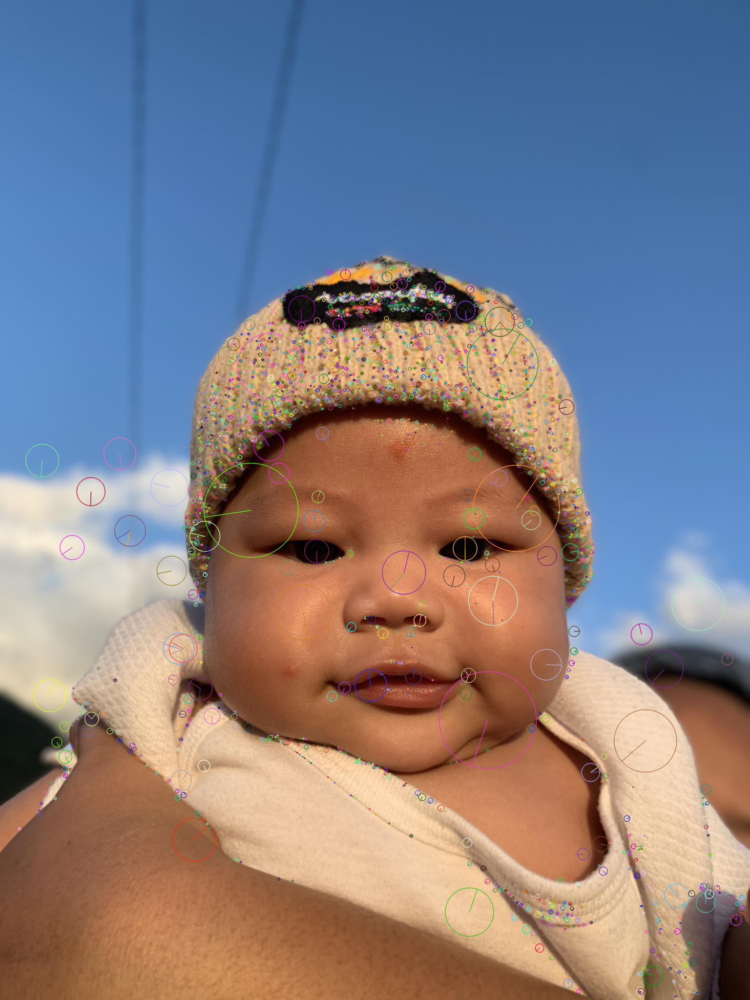

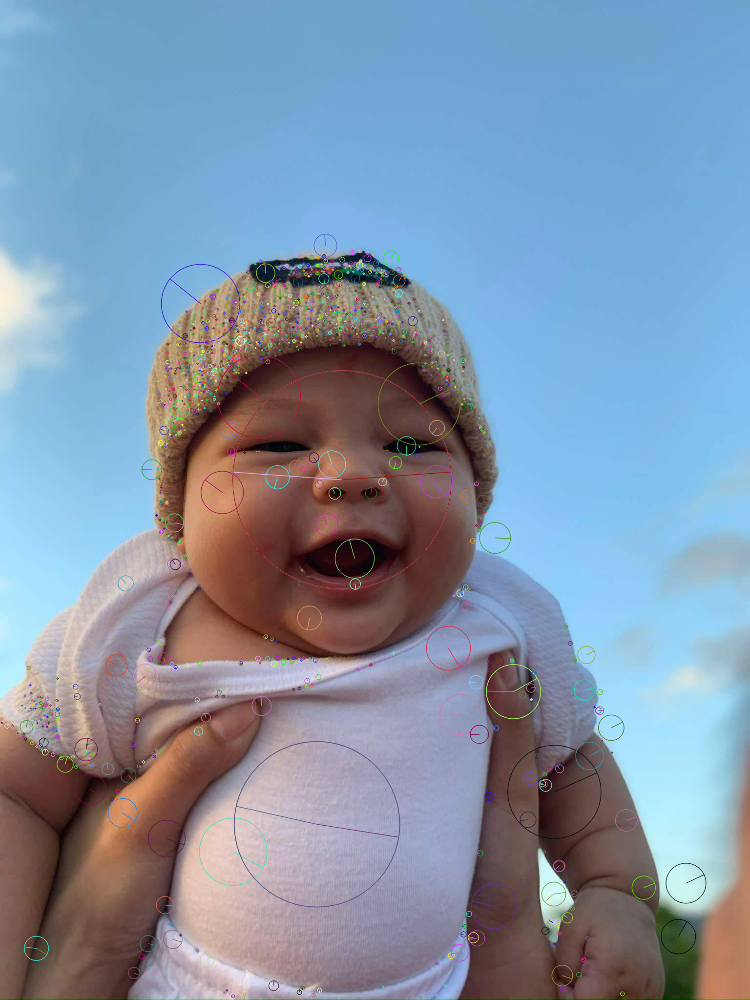

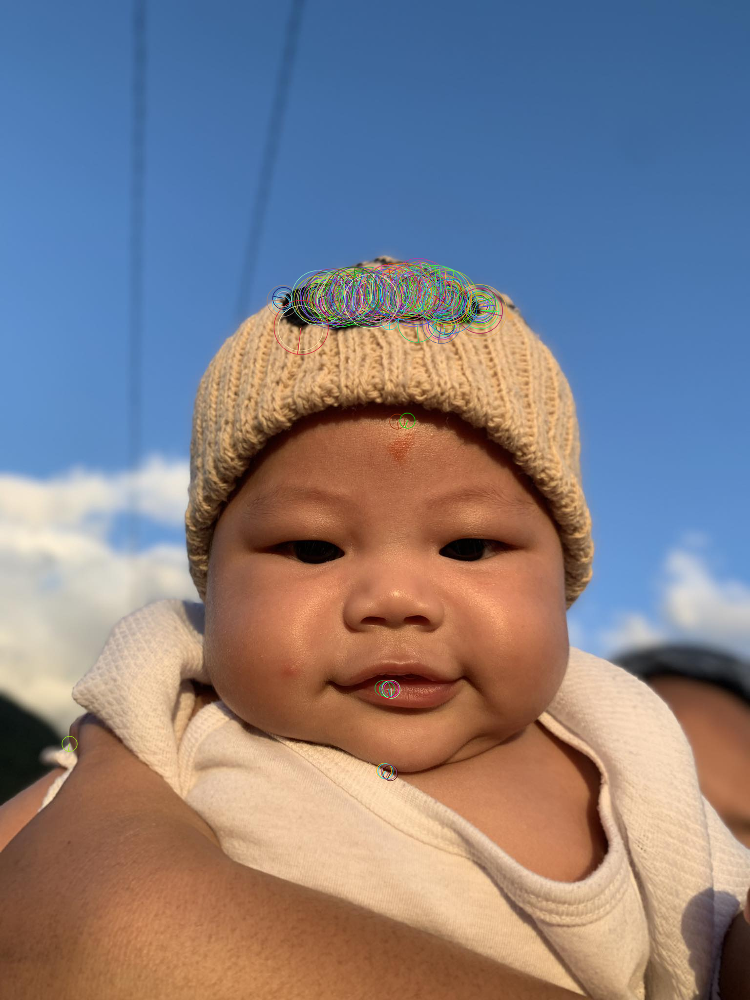

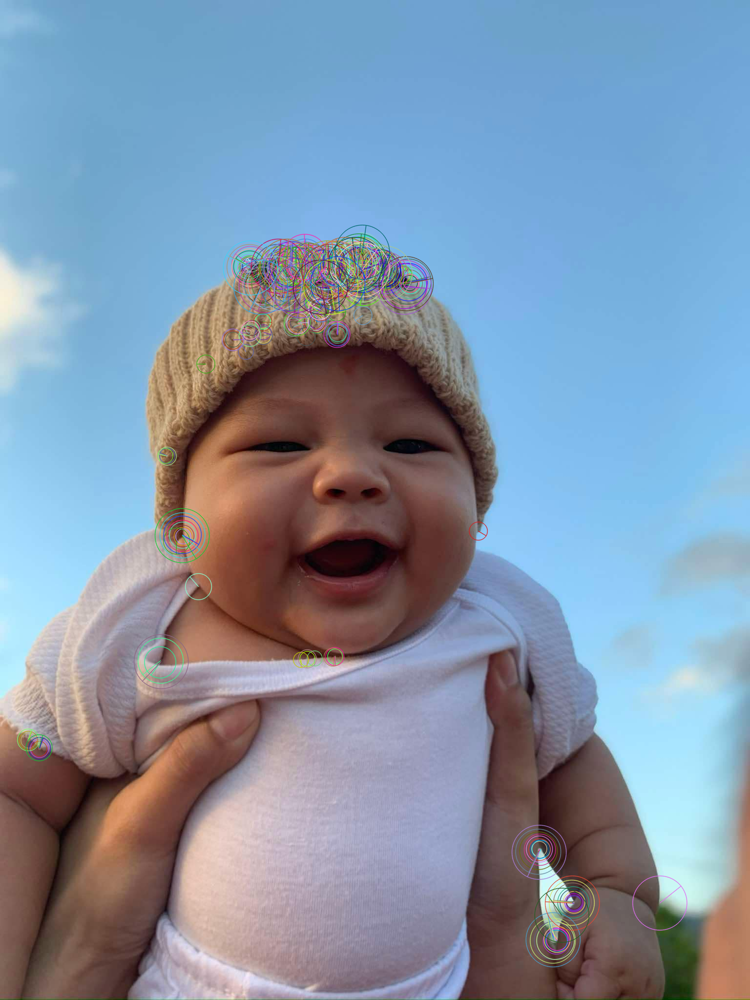

In [6]:
cv2_imshow(image1_sift)
cv2_imshow(image2_sift)
cv2_imshow(image1_orb)
cv2_imshow(image2_orb)

# Brute-Force Matcher and FLANN

In [7]:
import cv2

# Load the two images again (ensure they are loaded in your workspace)
image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')

# Brute-Force matcher with SIFT
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# SIFT Matching
matches_sift = bf.match(descriptors_sift_1, descriptors_sift_2)
matches_sift = sorted(matches_sift, key=lambda x: x.distance)

# Brute-Force matcher with ORB
bf_orb = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# ORB Matching
matches_orb = bf_orb.match(descriptors_orb_1, descriptors_orb_2)
matches_orb = sorted(matches_orb, key=lambda x: x.distance)

# FLANN matcher parameters for SIFT
index_params = dict(algorithm=1, trees=5)  # FLANN parameters for KDTree
search_params = dict(checks=50)  # The number of times the tree is recursively traversed

flann = cv2.FlannBasedMatcher(index_params, search_params)

# SIFT Matching using FLANN
matches_sift_flann = flann.knnMatch(descriptors_sift_1, descriptors_sift_2, k=2)

# Filter matches using Lowe's ratio test for SIFT
good_matches_sift = []
for m, n in matches_sift_flann:
    if m.distance < 0.7 * n.distance:
        good_matches_sift.append(m)

# FLANN parameters for ORB
FLANN_INDEX_LSH = 6
index_params = dict(algorithm=FLANN_INDEX_LSH, table_number=6, key_size=12, multi_probe_level=1)
search_params = {}

flann_orb = cv2.FlannBasedMatcher(index_params, search_params)

# ORB Matching using FLANN
matches_orb_flann = flann_orb.knnMatch(descriptors_orb_1, descriptors_orb_2, k=2)

# Filter matches using Lowe's ratio test for ORB
good_matches_orb = []
for m, n in matches_orb_flann:
    if m.distance < 0.7 * n.distance:
        good_matches_orb.append(m)

# Extract the matched keypoints' coordinates
if len(good_matches_sift) > 4:
    src_pts = np.float32([keypoints_sift_1[m.queryIdx].pt for m in good_matches_sift]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints_sift_2[m.trainIdx].pt for m in good_matches_sift]).reshape(-1, 1, 2)

    # Calculate the Homography matrix using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Warp the first image to align it with the second image
    height, width, channels = image2.shape
    aligned_image = cv2.warpPerspective(image1, H, (width, height))

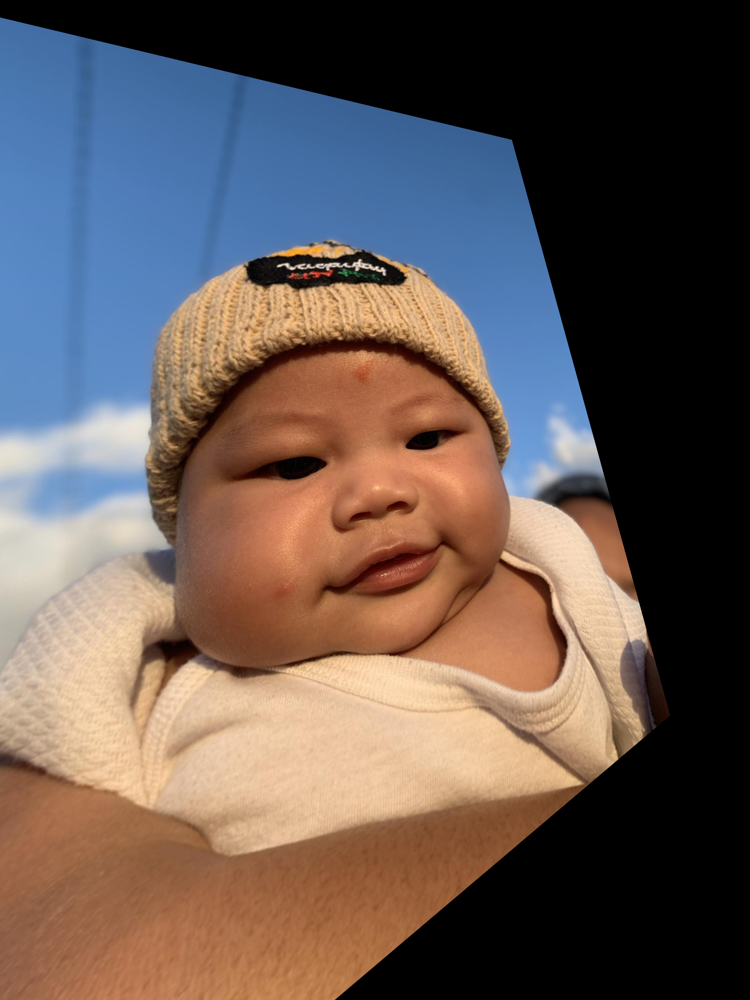

In [8]:
cv2_imshow(aligned_image)